In [48]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import itertools

!pip install gtsam
import gtsam
import gtsam.utils.plot
import plotly.graph_objects as go


In [49]:
def display_images_in_grid(images, title="Images"):
    num_images = len(images)
    cols = 5
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
    axes = axes.ravel()

    for idx, image in enumerate(images):
        cmap = 'gray' if len(image.shape) == 2 else None
        axes[idx].imshow(image, cmap=cmap)
        axes[idx].axis('off')
        axes[idx].set_title(f"Image {idx + 1}")
    for idx in range(len(images), len(axes)):
        axes[idx].axis('off')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

In [50]:
# Function to load, preprocess, and display images
def load_and_preprocess_images(image_dir, clahe_clip=2.0, clahe_grid_size=(8, 8)):
    images = []
    bgr_images = []
    clahe = cv2.createCLAHE(clipLimit=clahe_clip, tileGridSize=clahe_grid_size)

    for image_file_name in sorted(os.listdir(image_dir), reverse=True):
        image = cv2.imread(os.path.join(image_dir, image_file_name))
        bgr_images.append(image.astype(int))
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        enhanced_image = clahe.apply(gray_image)
        images.append(enhanced_image)

    # Display processed images
    display_images_in_grid(images, title="CLAHE-Enhanced Grayscale Images")

    return images, bgr_images


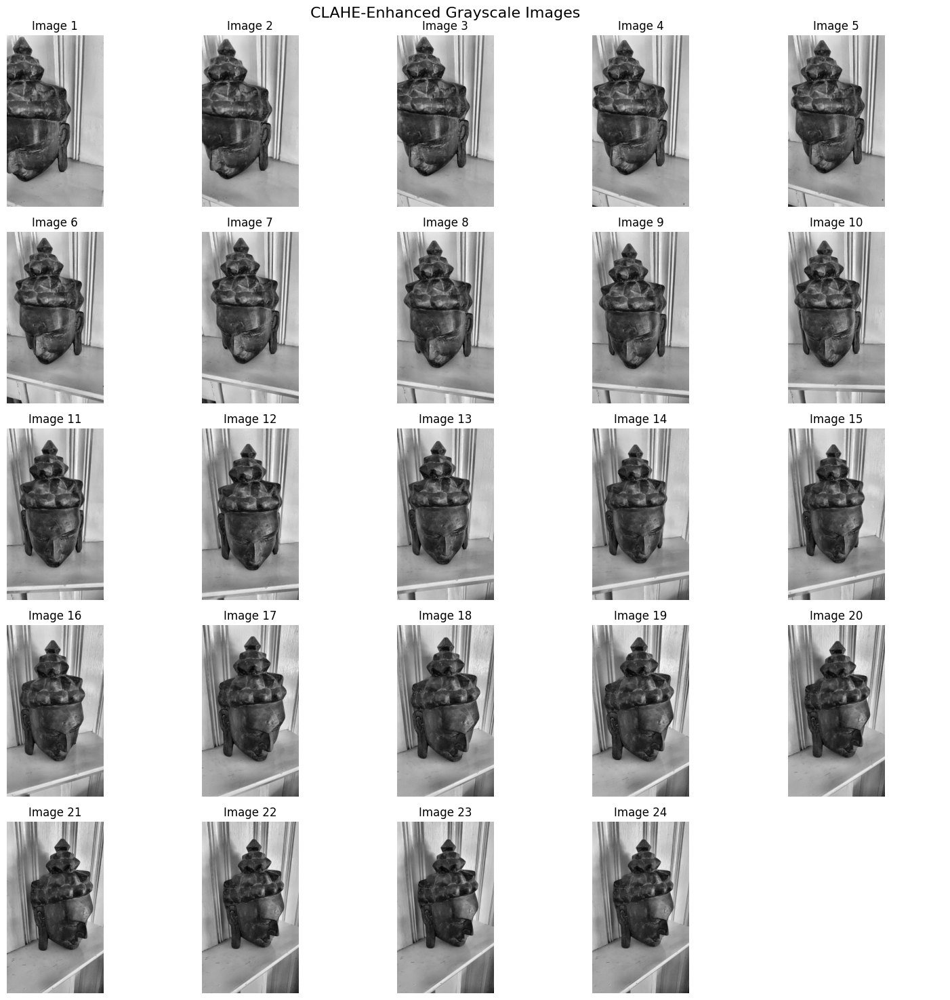

In [51]:
# Load and preprocess images
image_dir = '/content/drive/MyDrive/Project3/data/buddha_images/'
images, bgr_images = load_and_preprocess_images(image_dir)

In [52]:
# Function to display matching points between two images
def plot_match_points(left_image, right_image, left_points, right_points):
    left_image = cv2.cvtColor(left_image, cv2.COLOR_GRAY2RGB)
    right_image = cv2.cvtColor(right_image, cv2.COLOR_GRAY2RGB)

    match_image = np.hstack((left_image, right_image))
    left_image_width = left_image.shape[1]
    for left_point, right_point in zip(left_points.astype(int), right_points.astype(int)):
        left_match_point = tuple(left_point)
        right_match_point = tuple(right_point + np.array([left_image_width, 0]))
        cv2.circle(match_image, left_match_point, 5, (0, 255, 0), -1)
        cv2.circle(match_image, right_match_point, 5, (0, 255, 0), -1)
        cv2.line(match_image, left_match_point, right_match_point, (0, 255, 0), 1)

    plt.imshow(match_image)
    plt.show()

In [53]:
# Helper function for non-max suppression
def get_non_max_suppression_mask(image_shape, keypoints):
    image_height, image_width = image_shape
    binary_image = np.zeros((image_height, image_width))
    response_list = np.array([keypoint.response for keypoint in keypoints])
    mask = np.flip(np.argsort(response_list))
    point_list = np.rint([keypoint.pt for keypoint in keypoints])[mask].astype(int)
    non_max_suppression_mask = []
    for point, index in zip(point_list, mask):
        if binary_image[point[1], point[0]] == 0:
            non_max_suppression_mask.append(index)
            cv2.circle(binary_image, (point[0], point[1]), 3, 255, -1)

    return non_max_suppression_mask

In [74]:
def detect_features(images, nfeatures=5000, nOctaveLayers=6, contrastThreshold=0.04, sigma=1.5):
    sift = cv2.SIFT_create(nfeatures=nfeatures, nOctaveLayers=nOctaveLayers,
                           contrastThreshold=contrastThreshold, sigma=sigma)
    keypoints_list = []
    descriptors_list = []
    object_index_list = []
    images_with_keypoints = []

    for image in images:
        keypoints, descriptors = sift.detectAndCompute(image, None)

        non_max_suppression_mask = get_non_max_suppression_mask(image.shape, keypoints)

        keypoints_list.append(np.array(keypoints)[non_max_suppression_mask])
        descriptors_list.append(np.array(descriptors)[non_max_suppression_mask])
        object_index_list.append(np.full(len(keypoints), -1, int))  # Use len(keypoints)

        image_with_keypoints = cv2.drawKeypoints(
            image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        images_with_keypoints.append(image_with_keypoints)


    display_images_in_grid(images_with_keypoints, title="Images with Features")

    return keypoints_list, descriptors_list, object_index_list

def get_rint(num):
    return np.rint(num).astype(int)



Camera Intrinsic Matrix (K):
 [[1.08e+03 0.00e+00 5.40e+02]
 [0.00e+00 1.08e+03 9.60e+02]
 [0.00e+00 0.00e+00 1.00e+00]]


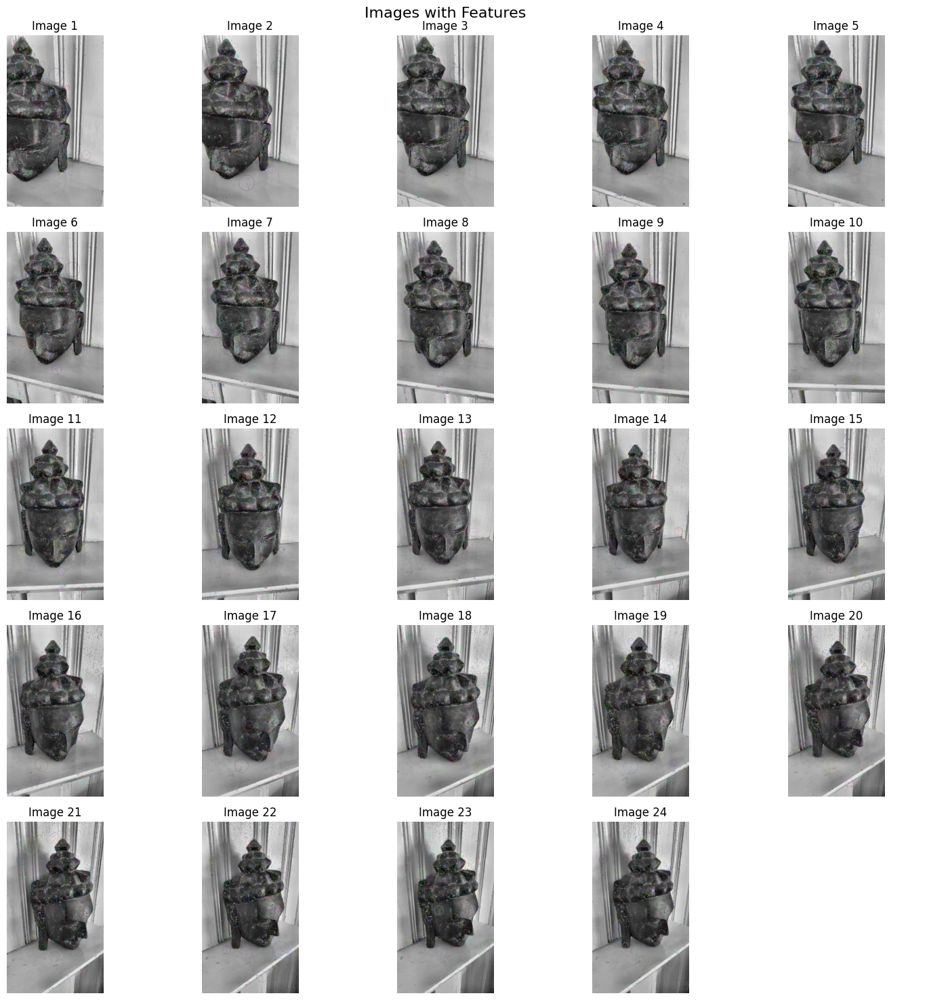

In [75]:
image_height, image_width = images[0].shape
camera_matrix = np.array([[image_width, 0, image_width / 2],
                          [0, image_width, image_height / 2],
                          [0, 0, 1]])
print("Camera Intrinsic Matrix (K):\n", camera_matrix)

# Detect features and descriptors
keypoints_list, descriptors_list, object_index_list = detect_features(images)

In [76]:
# Initialize Brute-Force matcher
bf_matcher = cv2.BFMatcher(cv2.NORM_L2)

# Function to match keypoints and filter using Lowe's ratio test
def get_match_points(src_keypoints, src_descriptors, dst_keypoints, dst_descriptors):
    matches = bf_matcher.knnMatch(src_descriptors, dst_descriptors, k=2)

    cross_matches = bf_matcher.match(dst_descriptors, src_descriptors)
    cross_match_dict = {cross_match.trainIdx: cross_match.queryIdx for cross_match in cross_matches}

    src_points, dst_points = [], []
    src_point_index_list, dst_point_index_list = [], []
    print(len(matches))

    for match_1, match_2 in matches:
        if match_1.distance < 0.75 * match_2.distance:
            src_points.append(src_keypoints[match_1.queryIdx].pt)
            dst_points.append(dst_keypoints[match_1.trainIdx].pt)
            src_point_index_list.append(match_1.queryIdx)
            dst_point_index_list.append(match_1.trainIdx)

    return np.array(src_points), np.array(dst_points), np.array(src_point_index_list), np.array(dst_point_index_list)

In [77]:
def display_epipolar_lines(img1, img2, points1, points2, fundamental_matrix):
    def draw_lines(image, lines, points):
        r, c = image.shape[:2]
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR) if len(image.shape) == 2 else image.copy()
        for r_line, pt in zip(lines, points):
            color = tuple(np.random.randint(0, 255, 3).tolist())
            x0, y0 = map(int, [0, -r_line[2] / r_line[1]])
            x1, y1 = map(int, [c, -(r_line[2] + r_line[0] * c) / r_line[1]])
            cv2.line(image, (x0, y0), (x1, y1), color, 1)
            cv2.circle(image, tuple(pt.astype(int)), 5, color, -1)
        return image

    # Compute epilines for points in the first image (drawn on the second image)
    lines_img2 = cv2.computeCorrespondEpilines(points1.reshape(-1, 1, 2), 1, fundamental_matrix)
    lines_img2 = lines_img2.reshape(-1, 3)
    img2_with_lines = draw_lines(img2, lines_img2, points2)

    # Compute epilines for points in the second image (drawn on the first image)
    lines_img1 = cv2.computeCorrespondEpilines(points2.reshape(-1, 1, 2), 2, fundamental_matrix)
    lines_img1 = lines_img1.reshape(-1, 3)
    img1_with_lines = draw_lines(img1, lines_img1, points1)

    # Display the images with epipolar lines
    plt.subplot(121)
    plt.imshow(cv2.cvtColor(img1_with_lines, cv2.COLOR_BGR2RGB))
    plt.title("Epipolar Lines on previous Image")
    plt.axis("off")

    plt.subplot(122)
    plt.imshow(cv2.cvtColor(img2_with_lines, cv2.COLOR_BGR2RGB))
    plt.title("Epipolar Lines on current Image")
    plt.axis("off")

    plt.show()


In [78]:
# Function to compute essential matrix and recover relative pose
def get_pose_index_mask(dst_points, src_points):
    essential_matrix, essential_mask = cv2.findEssentialMat(
        dst_points, src_points, camera_matrix, cv2.RANSAC, 0.999, 1.0)
    essential_mask = np.squeeze(essential_mask != 0)

    index_mask = np.arange(len(src_points))[essential_mask]
    src_points = src_points[essential_mask]
    dst_points = dst_points[essential_mask]

    _, rotation_matrix, translation, pose_mask = cv2.recoverPose(
        essential_matrix, dst_points, src_points, camera_matrix)
    pose_mask = np.squeeze(pose_mask != 0)

    return rotation_matrix, translation, index_mask[pose_mask]

3803


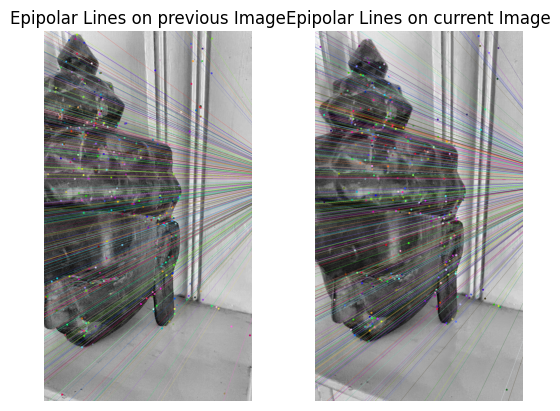

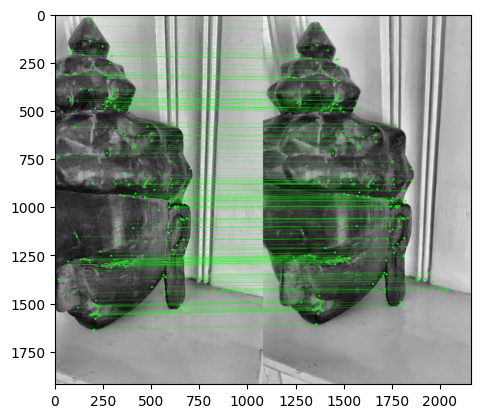

In [79]:
# GTSAM symbols and parameters
symbol_X = gtsam.symbol_shorthand.X  # Pose symbol
symbol_L = gtsam.symbol_shorthand.L  # Landmark symbol

# GTSAM camera calibration
gtsam_camera_matrix = gtsam.Cal3_S2(
    camera_matrix[0, 0], camera_matrix[1, 1], 0.0, camera_matrix[0, 2], camera_matrix[1, 2])

# Noise models for measurements, pose priors, and landmarks
measurement_noise = gtsam.noiseModel.Isotropic.Sigma(2, 1.0)
pose_noise = gtsam.noiseModel.Diagonal.Sigmas(np.array([0.3, 0.3, 0.3, 0.1, 0.1, 0.1]))
point_noise = gtsam.noiseModel.Isotropic.Sigma(3, 0.1)

# Initialize graph and values for optimization
graph = gtsam.NonlinearFactorGraph()
initial = gtsam.Values()

# Match points between the first two images
src_points, dst_points, src_point_index_list, dst_point_index_list = get_match_points(
    keypoints_list[0], descriptors_list[0], keypoints_list[1], descriptors_list[1])


# Compute the fundamental matrix
fundamental_matrix, _ = cv2.findFundamentalMat(src_points, dst_points, cv2.RANSAC, 0.999, 1.0)

# Display epipolar lines on the first image pair
display_epipolar_lines(images[0], images[1], src_points, dst_points, fundamental_matrix)

# Estimate relative pose
rotation_matrix, translation, index_mask = get_pose_index_mask(dst_points, src_points)

# Filter points using the pose estimation mask
src_points = src_points[index_mask]
dst_points = dst_points[index_mask]
src_point_index_list = src_point_index_list[index_mask]
dst_point_index_list = dst_point_index_list[index_mask]


# Plot matching points between the first two images
plot_match_points(images[0], images[1], src_points, dst_points)

In [80]:
# Function to triangulate points and compute 3D object points
def get_object_points(src_projection_matrix, dst_projection_matrix, src_points, dst_points):
    if src_points.shape[0] == 0 or dst_points.shape[0] == 0:
        return np.empty((0, 3))

    if src_points.shape[1] != 2 or dst_points.shape[1] != 2:
        raise ValueError("Input points must be in 2D format (N, 2).")

    object_points = cv2.triangulatePoints(
        src_projection_matrix, dst_projection_matrix, src_points.T, dst_points.T)

    return (object_points / object_points[-1])[:-1].T

In [81]:
# Function to create a transformation matrix from rotation and translation
def get_transformation_matrix(rotation_matrix, translation):
    transformation_matrix = np.eye(4)
    transformation_matrix[:3, :] = np.hstack((rotation_matrix, translation))
    return transformation_matrix

# Function to compute the projection matrix from the transformation matrix
def get_projection_matrix(transformation_matrix):
    return camera_matrix.dot(np.linalg.inv(transformation_matrix)[:3])

In [82]:
# Initialize the first pose as identity
pose_factor = gtsam.PriorFactorPose3(symbol_X(0), gtsam.Pose3(), pose_noise)
graph.push_back(pose_factor)
initial.insert(symbol_X(0), gtsam.Pose3())

# Add the second pose based on the estimated relative rotation and translation
initial.insert(symbol_X(1),
               gtsam.Pose3(gtsam.Rot3(rotation_matrix),
                           gtsam.Point3(translation.flatten())))

# Compute projection matrix for the second image
transformation_matrix = get_transformation_matrix(rotation_matrix, translation)
projection_matrix = get_projection_matrix(transformation_matrix)

# Triangulate points between the first two images
sum_all_object_points = list(get_object_points(
    camera_matrix.dot(np.hstack((np.eye(3), np.zeros((3, 1))))),
    projection_matrix,
    src_points, dst_points))

# Initialize previous transformation and projection matrices
prev_transformation_matrix = transformation_matrix.copy()
prev_projection_matrix = projection_matrix.copy()

# Add a prior factor for the first 3D point
point_factor = gtsam.PriorFactorPoint3(symbol_L(0), sum_all_object_points[0], point_noise)
graph.push_back(point_factor)

# Lists to store object point colors and counts for color averaging
sum_all_object_points_color = []
all_object_points_count = []

# Map object indices to points in the first and second images
src_object_index_array = object_index_list[0]
dst_object_index_array = object_index_list[1]
src_bgr_image = bgr_images[0]
dst_bgr_image = bgr_images[1]

# Round points for color assignment
rint_src_points = get_rint(src_points)
rint_dst_points = get_rint(dst_points)

# Loop through matched points and assign colors
for object_index, (src_point, dst_point, src_point_index, dst_point_index, object_point, rint_src_point, rint_dst_point) in enumerate(zip(src_points,
                                                                                                                                          dst_points,
                                                                                                                                          src_point_index_list,
                                                                                                                                          dst_point_index_list,
                                                                                                                                          sum_all_object_points,
                                                                                                                                          rint_src_points,
                                                                                                                                          rint_dst_points)):

    src_object_index_array[src_point_index] = object_index
    dst_object_index_array[dst_point_index] = object_index

    graph.push_back(gtsam.GenericProjectionFactorCal3_S2(
        src_point, measurement_noise, symbol_X(0), symbol_L(object_index), gtsam_camera_matrix))

    graph.push_back(gtsam.GenericProjectionFactorCal3_S2(
        dst_point, measurement_noise, symbol_X(1), symbol_L(object_index), gtsam_camera_matrix))

    sum_all_object_points_color.append(
        src_bgr_image[rint_src_point[1], rint_src_point[0]] + dst_bgr_image[rint_dst_point[1], rint_dst_point[0]])
    all_object_points_count.append(2)


3107


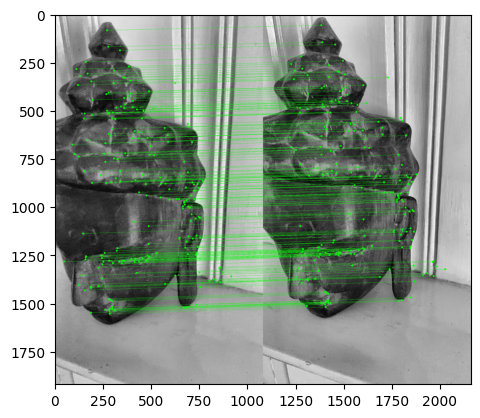

[[ 1.07336596e+03 -1.89639262e+01  5.52743951e+02  1.19667010e+03]
 [ 4.37158696e+00  1.07441288e+03  9.66239021e+02  2.71492161e+02]
 [-1.19282919e-02 -5.67988822e-03  9.99912724e-01  4.32358088e-01]]
[[ 1.07026588e+03 -6.04778734e+00  5.59011962e+02  1.74262467e+03]
 [-1.44820510e+01  1.07391329e+03  9.66695672e+02 -1.18958559e+02]
 [-1.77071515e-02 -6.31454132e-03  9.99823276e-01  6.05354200e-01]]
3894


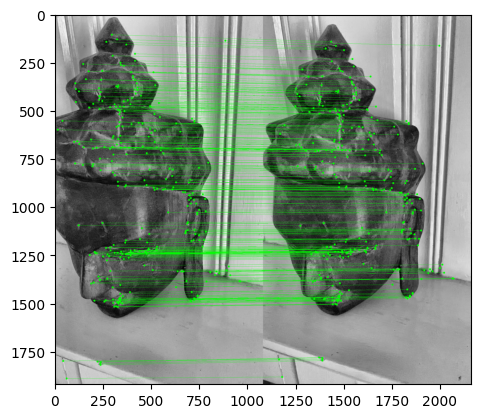

[[ 1.07026588e+03 -6.04778734e+00  5.59011962e+02  1.74262467e+03]
 [-1.44820510e+01  1.07391329e+03  9.66695672e+02 -1.18958559e+02]
 [-1.77071515e-02 -6.31454132e-03  9.99823276e-01  6.05354200e-01]]
[[ 1.07327646e+03  5.15539189e+00  5.53218812e+02  2.88217822e+03]
 [-2.00313349e+01  1.07453096e+03  9.65909909e+02  3.95688157e+02]
 [-1.22423476e-02 -5.64651406e-03  9.99909117e-01  1.08877205e+00]]
4010


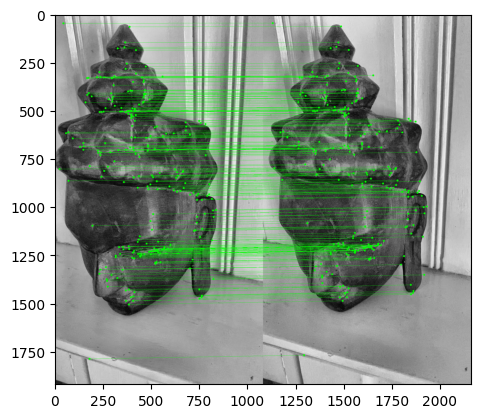

[[ 1.07327646e+03  5.15539189e+00  5.53218812e+02  2.88217822e+03]
 [-2.00313349e+01  1.07453096e+03  9.65909909e+02  3.95688157e+02]
 [-1.22423476e-02 -5.64651406e-03  9.99909117e-01  1.08877205e+00]]
[[ 1.07644911e+03  2.65377671e+01  5.46400092e+02  3.52715643e+03]
 [-3.14722988e+01  1.08109401e+03  9.58251132e+02  5.35740331e+02]
 [-5.97197420e-03  1.46058171e-03  9.99981101e-01  1.35103930e+00]]
3863


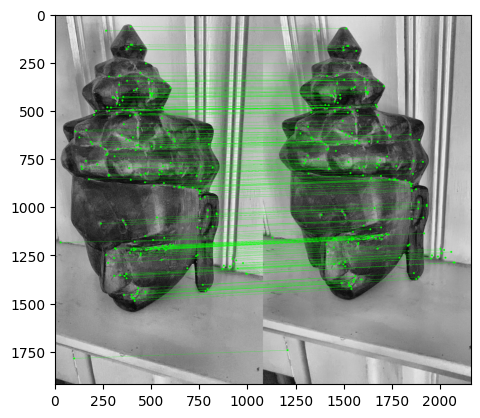

[[ 1.07644911e+03  2.65377671e+01  5.46400092e+02  3.52715643e+03]
 [-3.14722988e+01  1.08109401e+03  9.58251132e+02  5.35740331e+02]
 [-5.97197420e-03  1.46058171e-03  9.99981101e-01  1.35103930e+00]]
[[ 1.09290841e+03  4.48177749e+01  5.11412324e+02  5.18710000e+03]
 [-1.51035314e+01  1.08819935e+03  9.50575651e+02  9.40516967e+02]
 [ 2.59519594e-02  9.35313090e-03  9.99619435e-01  2.32272830e+00]]
3993


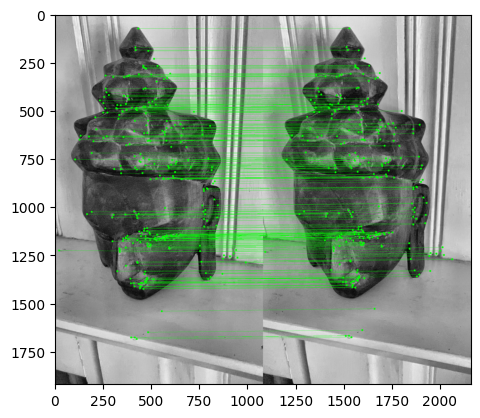

[[ 1.09290841e+03  4.48177749e+01  5.11412324e+02  5.18710000e+03]
 [-1.51035314e+01  1.08819935e+03  9.50575651e+02  9.40516967e+02]
 [ 2.59519594e-02  9.35313090e-03  9.99619435e-01  2.32272830e+00]]
[[ 1.10641981e+03  6.29836501e+01  4.79445781e+02  6.02140880e+03]
 [-4.83084742e+00  1.08942219e+03  9.49281812e+02  9.68392782e+02]
 [ 5.47568698e-02  1.14456791e-02  9.98434115e-01  2.46940944e+00]]
3976


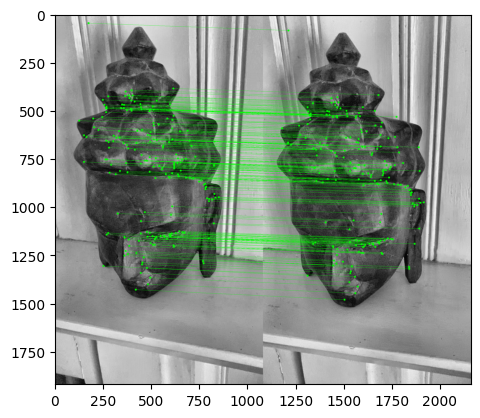

[[ 1.10641981e+03  6.29836501e+01  4.79445781e+02  6.02140880e+03]
 [-4.83084742e+00  1.08942219e+03  9.49281812e+02  9.68392782e+02]
 [ 5.47568698e-02  1.14456791e-02  9.98434115e-01  2.46940944e+00]]
[[ 1.12278886e+03  7.88007316e+01  4.37190603e+02  6.45572831e+03]
 [ 7.31556726e+00  1.06673291e+03  9.74693476e+02  9.23460380e+02]
 [ 9.40367629e-02 -1.03213501e-02  9.95515222e-01  2.31055892e+00]]
3930


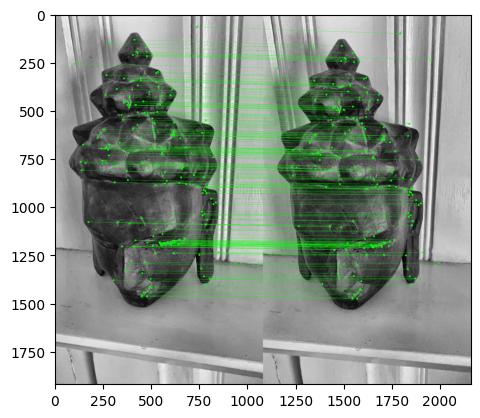

[[ 1.12278886e+03  7.88007316e+01  4.37190603e+02  6.45572831e+03]
 [ 7.31556726e+00  1.06673291e+03  9.74693476e+02  9.23460380e+02]
 [ 9.40367629e-02 -1.03213501e-02  9.95515222e-01  2.31055892e+00]]
[[ 1.13798707e+03  1.01371300e+02  3.90780354e+02  7.38557422e+03]
 [ 2.39959426e+01  1.06002339e+03  9.81720228e+02  1.26378319e+03]
 [ 1.35666105e-01 -1.48952880e-02  9.90642639e-01  2.61680415e+00]]
3903


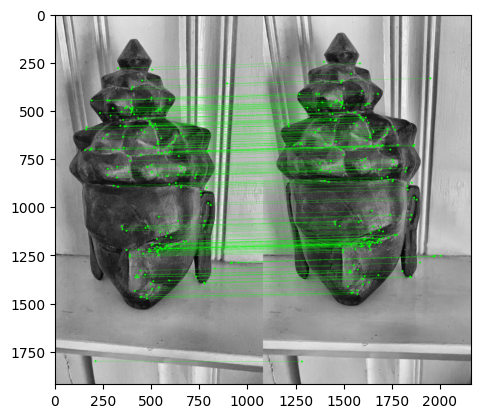

[[ 1.13798707e+03  1.01371300e+02  3.90780354e+02  7.38557422e+03]
 [ 2.39959426e+01  1.06002339e+03  9.81720228e+02  1.26378319e+03]
 [ 1.35666105e-01 -1.48952880e-02  9.90642639e-01  2.61680415e+00]]
[[ 1.15359552e+03  1.37076735e+02  3.29283082e+02  8.48047071e+03]
 [ 4.52037928e+01  1.06933666e+03  9.70811885e+02  1.00747022e+03]
 [ 1.87972126e-01 -1.87206297e-03  9.82172579e-01  2.76151289e+00]]
3915


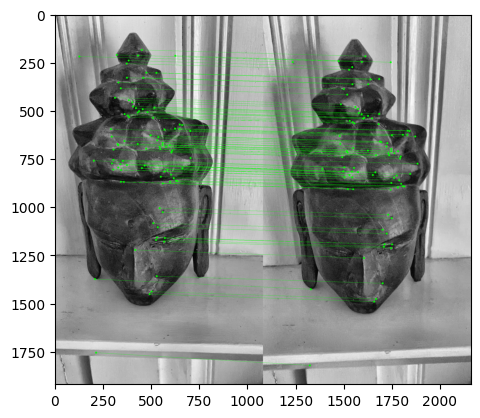

[[ 1.15359552e+03  1.37076735e+02  3.29283082e+02  8.48047071e+03]
 [ 4.52037928e+01  1.06933666e+03  9.70811885e+02  1.00747022e+03]
 [ 1.87972126e-01 -1.87206297e-03  9.82172579e-01  2.76151289e+00]]
[[ 1.16682018e+03  1.71933151e+02  2.58784970e+02  1.03071298e+04]
 [ 7.03212169e+01  1.05423142e+03  9.85723608e+02  1.13619462e+03]
 [ 2.49727090e-01 -1.13708418e-02  9.68249495e-01  2.99641730e+00]]
3601


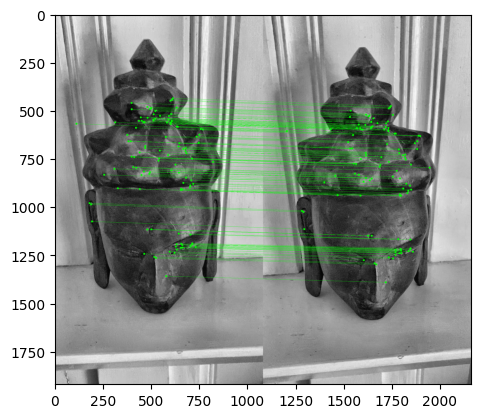

[[ 1.16682018e+03  1.71933151e+02  2.58784970e+02  1.03071298e+04]
 [ 7.03212169e+01  1.05423142e+03  9.85723608e+02  1.13619462e+03]
 [ 2.49727090e-01 -1.13708418e-02  9.68249495e-01  2.99641730e+00]]
[[ 1.17244026e+03  1.88748996e+02  2.18535254e+02  1.14833932e+04]
 [ 8.80787724e+01  1.02753865e+03  1.01212966e+03  1.27373595e+03]
 [ 2.87509832e-01 -3.32205719e-02  9.57201384e-01  3.30377317e+00]]
3798


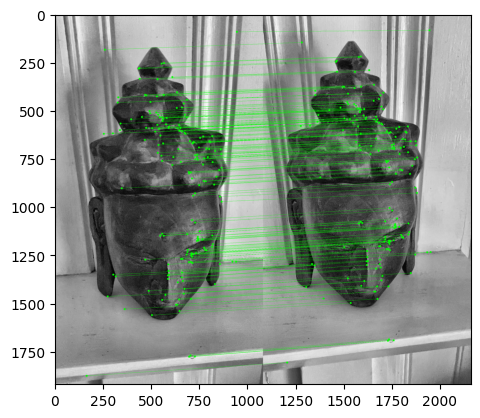

[[ 1.17244026e+03  1.88748996e+02  2.18535254e+02  1.14833932e+04]
 [ 8.80787724e+01  1.02753865e+03  1.01212966e+03  1.27373595e+03]
 [ 2.87509832e-01 -3.32205719e-02  9.57201384e-01  3.30377317e+00]]
[[ 1.18299522e+03  1.95619214e+02  1.42321546e+02  1.16839315e+04]
 [ 1.47748293e+02  1.01883987e+03  1.01397029e+03  7.84801913e+02]
 [ 3.50481168e-01 -3.98275309e-02  9.35722565e-01  3.75463506e+00]]
3867


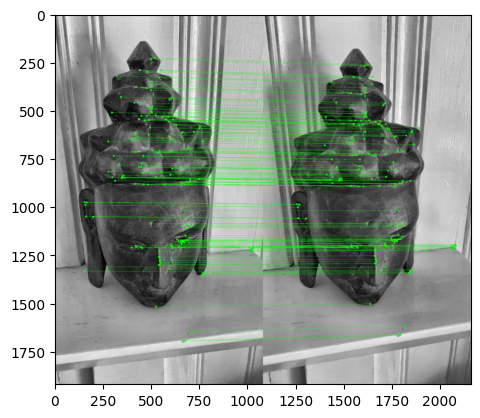

[[ 1.18299522e+03  1.95619214e+02  1.42321546e+02  1.16839315e+04]
 [ 1.47748293e+02  1.01883987e+03  1.01397029e+03  7.84801913e+02]
 [ 3.50481168e-01 -3.98275309e-02  9.35722565e-01  3.75463506e+00]]
[[ 1.18600435e+03  2.12209880e+02  7.97537168e+01  1.28999338e+04]
 [ 1.87261922e+02  1.01696475e+03  1.00931446e+03  1.44823159e+03]
 [ 4.00610848e-01 -3.83413222e-02  9.15445734e-01  4.56555082e+00]]
3231


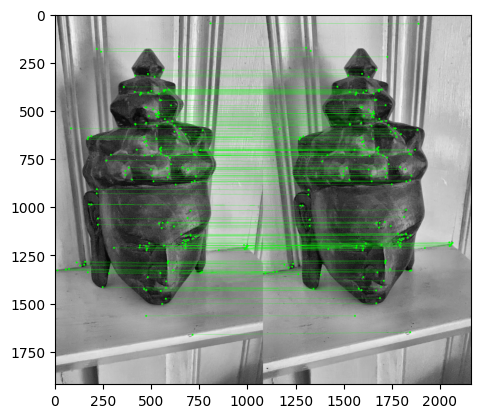

[[ 1.18600435e+03  2.12209880e+02  7.97537168e+01  1.28999338e+04]
 [ 1.87261922e+02  1.01696475e+03  1.00931446e+03  1.44823159e+03]
 [ 4.00610848e-01 -3.83413222e-02  9.15445734e-01  4.56555082e+00]]
[[ 1.18405258e+03  2.35014616e+02  2.80647290e+01  1.39387748e+04]
 [ 2.11004502e+02  1.02357094e+03  9.97887586e+02  1.65987623e+03]
 [ 4.40302841e-01 -2.77750831e-02  8.97419608e-01  4.93826885e+00]]
3213


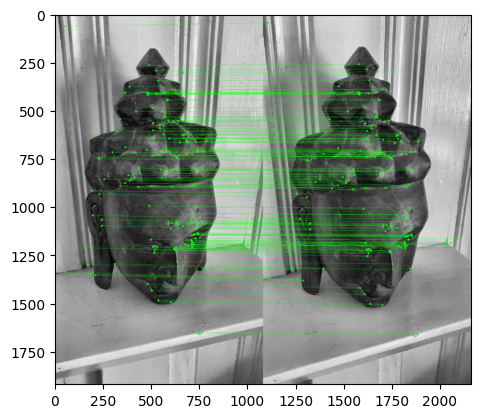

[[ 1.18405258e+03  2.35014616e+02  2.80647290e+01  1.39387748e+04]
 [ 2.11004502e+02  1.02357094e+03  9.97887586e+02  1.65987623e+03]
 [ 4.40302841e-01 -2.77750831e-02  8.97419608e-01  4.93826885e+00]]
[[ 1.17831886e+03  2.61994747e+02 -3.03876540e+01  1.48240707e+04]
 [ 2.36774474e+02  1.02827702e+03  9.87210326e+02  1.69755294e+03]
 [ 4.84739674e-01 -1.75745807e-02  8.74481894e-01  5.07828318e+00]]
3998


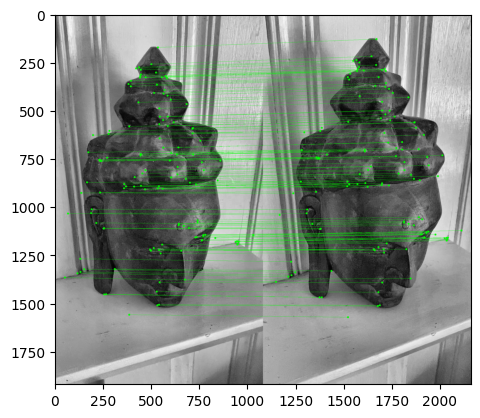

[[ 1.17831886e+03  2.61994747e+02 -3.03876540e+01  1.48240707e+04]
 [ 2.36774474e+02  1.02827702e+03  9.87210326e+02  1.69755294e+03]
 [ 4.84739674e-01 -1.75745807e-02  8.74481894e-01  5.07828318e+00]]
[[ 1.16729872e+03  2.96490808e+02 -8.66424218e+01  1.61276827e+04]
 [ 2.52441579e+02  1.03870787e+03  9.72295846e+02  1.55694458e+03]
 [ 5.25701029e-01  1.81857413e-04  8.50669380e-01  5.34687717e+00]]
3852


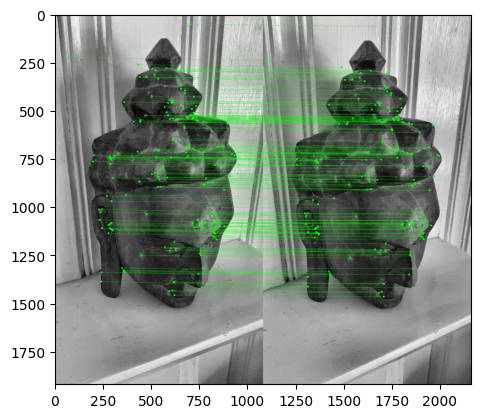

[[ 1.16729872e+03  2.96490808e+02 -8.66424218e+01  1.61276827e+04]
 [ 2.52441579e+02  1.03870787e+03  9.72295846e+02  1.55694458e+03]
 [ 5.25701029e-01  1.81857413e-04  8.50669380e-01  5.34687717e+00]]
[[ 1.15251654e+03  3.33702508e+02 -1.35455726e+02  1.68355273e+04]
 [ 2.62128352e+02  1.04085492e+03  9.67424293e+02  1.75986983e+03]
 [ 5.62205338e-01  1.21620393e-02  8.26908243e-01  5.65822030e+00]]
3831


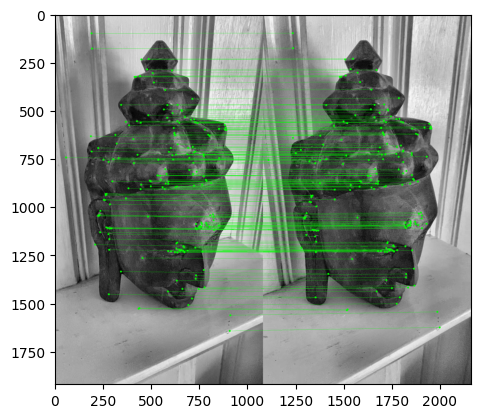

[[ 1.15251654e+03  3.33702508e+02 -1.35455726e+02  1.68355273e+04]
 [ 2.62128352e+02  1.04085492e+03  9.67424293e+02  1.75986983e+03]
 [ 5.62205338e-01  1.21620393e-02  8.26908243e-01  5.65822030e+00]]
[[ 1.13438645e+03  3.71985691e+02 -1.81091223e+02  1.76778300e+04]
 [ 2.65796952e+02  1.04913864e+03  9.57423671e+02  1.86962667e+03]
 [ 5.94163499e-01  3.10234651e-02  8.03745781e-01  5.99797597e+00]]
3897


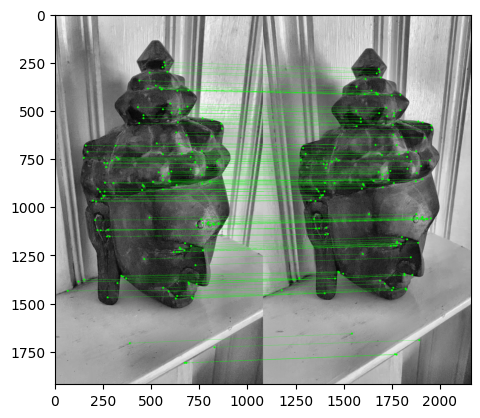

[[ 1.13438645e+03  3.71985691e+02 -1.81091223e+02  1.76778300e+04]
 [ 2.65796952e+02  1.04913864e+03  9.57423671e+02  1.86962667e+03]
 [ 5.94163499e-01  3.10234651e-02  8.03745781e-01  5.99797597e+00]]
[[ 1.11215681e+03  4.05748603e+02 -2.37645344e+02  1.88695420e+04]
 [ 2.79126735e+02  1.06241133e+03  9.38813308e+02  2.94508939e+03]
 [ 6.31167270e-01  5.40335963e-02  7.73762398e-01  7.42884613e+00]]
3457


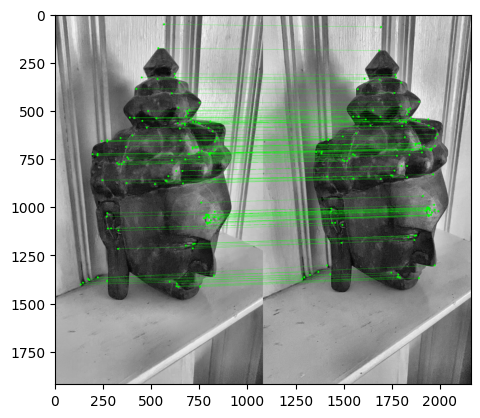

[[ 1.11215681e+03  4.05748603e+02 -2.37645344e+02  1.88695420e+04]
 [ 2.79126735e+02  1.06241133e+03  9.38813308e+02  2.94508939e+03]
 [ 6.31167270e-01  5.40335963e-02  7.73762398e-01  7.42884613e+00]]
[[ 1.10220520e+03  4.25295184e+02 -2.49534985e+02  1.95621226e+04]
 [ 2.69179756e+02  1.06926810e+03  9.33920756e+02  3.40371308e+03]
 [ 6.37760620e-01  6.70762742e-02  7.67308389e-01  8.34276929e+00]]
3833


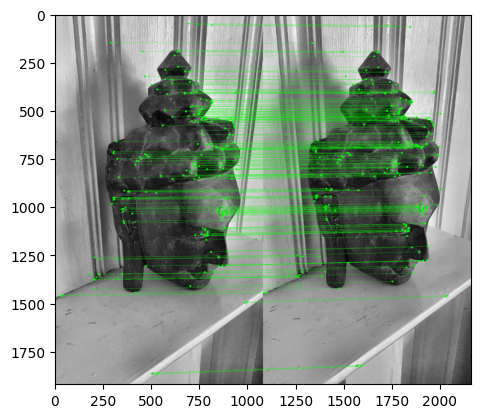

[[ 1.10220520e+03  4.25295184e+02 -2.49534985e+02  1.95621226e+04]
 [ 2.69179756e+02  1.06926810e+03  9.33920756e+02  3.40371308e+03]
 [ 6.37760620e-01  6.70762742e-02  7.67308389e-01  8.34276929e+00]]
[[ 1.08748962e+03  4.37425898e+02 -2.89870489e+02  1.95040302e+04]
 [ 2.90795602e+02  1.07349516e+03  9.22521582e+02  3.64374037e+03]
 [ 6.64446786e-01  7.53234249e-02  7.43529993e-01  8.81628788e+00]]
3856


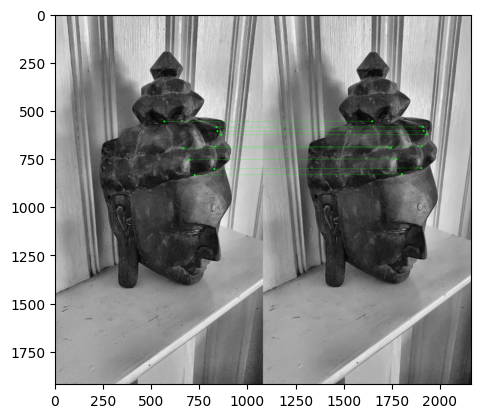

[[ 1.08748962e+03  4.37425898e+02 -2.89870489e+02  1.95040302e+04]
 [ 2.90795602e+02  1.07349516e+03  9.22521582e+02  3.64374037e+03]
 [ 6.64446786e-01  7.53234249e-02  7.43529993e-01  8.81628788e+00]]
[[ 1.08307973e+03  4.40471868e+02 -3.01534121e+02  1.95130964e+04]
 [ 2.96795613e+02  1.07563566e+03  9.18106910e+02  3.71528758e+03]
 [ 6.71763306e-01  7.84115179e-02  7.36604164e-01  8.91883853e+00]]
2632


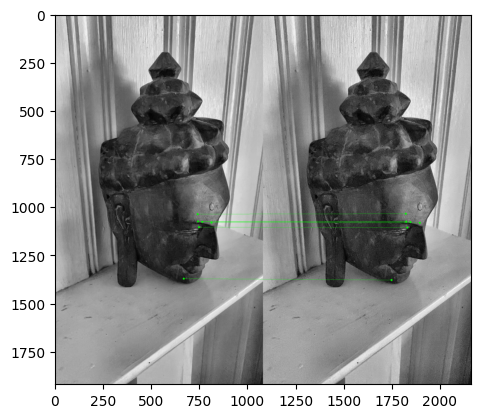

Skipping triangulation for images 22 and 23 due to no matching points.


In [83]:

# Process remaining image pairs in the dataset
for src_index in range(1, len(images) - 1):
    dst_index = src_index + 1

    # Match points between the current pair of images
    src_points, dst_points, src_point_index_list, dst_point_index_list = get_match_points(
        keypoints_list[src_index], descriptors_list[src_index], keypoints_list[dst_index], descriptors_list[dst_index])

    # uncomment it to display epipolar lines
    # Compute the fundamental matrix
    # fundamental_matrix, _ = cv2.findFundamentalMat(src_points, dst_points, cv2.RANSAC, 0.999, 1.0)

    # Display epipolar lines for the current image pair
    # display_epipolar_lines(images[src_index], images[dst_index], src_points, dst_points, fundamental_matrix)

    # Estimate relative pose between the current pair of images
    rotation_matrix, translation, index_mask = get_pose_index_mask(dst_points, src_points)

    # Filter matched points using the pose estimation mask
    src_points = src_points[index_mask]
    dst_points = dst_points[index_mask]
    src_point_index_list = src_point_index_list[index_mask]
    dst_point_index_list = dst_point_index_list[index_mask]

    # Plot matching points between the current pair of images
    plot_match_points(images[src_index], images[dst_index], src_points, dst_points)

    # Compute the transformation and projection matrices for the current image
    transformation_matrix = get_transformation_matrix(rotation_matrix, translation).dot(prev_transformation_matrix)
    projection_matrix = get_projection_matrix(transformation_matrix)

    # Initialize arrays for matched points and object points
    match_src_points = []
    match_dst_points = []
    match_object_points = []

    # Update object index mappings
    src_object_index_array = object_index_list[src_index]
    dst_object_index_array = object_index_list[dst_index]
    src_bgr_image = bgr_images[src_index]
    dst_bgr_image = bgr_images[dst_index]

    # Loop through matched points to check existing object associations
    for src_point, dst_point, src_point_index in zip(src_points, dst_points, src_point_index_list):
        object_index = src_object_index_array[src_point_index]
        if object_index != -1:  # If the point already has an associated object index
            match_src_points.append(src_point)
            match_dst_points.append(dst_point)
            match_object_points.append(
                sum_all_object_points[object_index] / (all_object_points_count[object_index] - 1))

    match_src_points = np.array(match_src_points)
    match_dst_points = np.array(match_dst_points)
    match_object_points = np.array(match_object_points)

    if match_src_points.size == 0 or match_dst_points.size == 0:
      print(f"Skipping triangulation for images {src_index} and {dst_index} due to no matching points.")
      continue

    # Triangulate new object points
    object_points = get_object_points(
        prev_projection_matrix, projection_matrix, match_src_points, match_dst_points)

    # Scale adjustment based on the relative size of object points
    scale = 0
    for match_object_point, object_point in zip(match_object_points, object_points):
        scale += cv2.norm(match_object_point) / cv2.norm(object_point)

    scale /= len(object_points)
    translation *= scale

    # Update transformation and projection matrices with scaled translation
    transformation_matrix = get_transformation_matrix(rotation_matrix, translation).dot(prev_transformation_matrix)
    projection_matrix = get_projection_matrix(transformation_matrix)

    # Add the new pose to the initial estimates
    initial.insert(symbol_X(dst_index),
                   gtsam.Pose3(gtsam.Rot3(transformation_matrix[:3, :3]),
                               gtsam.Point3(transformation_matrix[:3, 3])))

    print(prev_projection_matrix)
    print(projection_matrix)
    # Update triangulated object points
    object_points = get_object_points(
        prev_projection_matrix, projection_matrix, src_points, dst_points)

    prev_transformation_matrix = transformation_matrix.copy()
    prev_projection_matrix = projection_matrix.copy()

    rint_src_points = get_rint(src_points)
    rint_dst_points = get_rint(dst_points)

    current_object_index = len(all_object_points_count)

    # Loop through the matched points to update or create new object indices
    for src_point, dst_point, src_point_index, dst_point_index, object_point, rint_src_point, rint_dst_point in zip(
        src_points, dst_points, src_point_index_list, dst_point_index_list, object_points, rint_src_points, rint_dst_points):

        object_index = src_object_index_array[src_point_index]
        if object_index == -1:  # New object
            object_index = current_object_index

            sum_all_object_points.append(object_point)
            sum_all_object_points_color.append(
                src_bgr_image[rint_src_point[1], rint_src_point[0]] + dst_bgr_image[rint_dst_point[1], rint_dst_point[0]])
            all_object_points_count.append(2)

            src_object_index_array[src_point_index] = dst_object_index_array[dst_point_index] = object_index
            current_object_index += 1
        else:  # Existing object
            dst_object_index_array[dst_point_index] = object_index

            sum_all_object_points[object_index] += object_point
            sum_all_object_points_color[object_index] += dst_bgr_image[rint_dst_point[1], rint_dst_point[0]]
            all_object_points_count[object_index] += 1

        # Add projection factors to the graph
        graph.push_back(gtsam.GenericProjectionFactorCal3_S2(
            src_point, measurement_noise, symbol_X(src_index), symbol_L(object_index), gtsam_camera_matrix))

        graph.push_back(gtsam.GenericProjectionFactorCal3_S2(
            dst_point, measurement_noise, symbol_X(dst_index), symbol_L(object_index), gtsam_camera_matrix))

# Normalize the object points and colors
all_object_points_count = np.array(
    [all_object_points_count, all_object_points_count, all_object_points_count]).T
all_object_points = np.array(sum_all_object_points) / (all_object_points_count - 1)
all_object_points_color = np.flip(np.array(sum_all_object_points_color) / all_object_points_count).astype(np.uint8)

# Add the object points to the initial estimates
for object_index, object_point in enumerate(all_object_points):
    initial.insert(symbol_L(object_index), gtsam.Point3(object_point))


In [84]:
def plot_camera_trajectory_and_points(values, num_images, object_points, object_colors, title, axis_limits):
    fig = go.Figure()
    # Plot camera trajectory
    trajectory_points = []
    for i in range(num_images):
        key = symbol_X(i)
        if not values.exists(key):
            print(f"Pose {i} not found in the provided values. Skipping.")
            continue

        pose = values.atPose3(key)
        position = pose.translation()
        trajectory_points.append(position)

        # Plot camera axes for each pose
        rotation = pose.rotation().matrix()
        scale = 8  # Scale for camera axes
        axes = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 1]]) * scale
        transformed_axes = (rotation @ axes.T).T + position

        for axis, color in zip(transformed_axes, ['red', 'green', 'blue']):
            fig.add_trace(go.Scatter3d(
                x=[position[0], axis[0]],
                y=[position[1], axis[1]],
                z=[position[2], axis[2]],
                mode='lines',
                line=dict(width=2, color=color),
                name=f'Pose {i} Axis'
            ))

    trajectory_points = np.array(trajectory_points)
    fig.add_trace(go.Scatter3d(
        x=trajectory_points[:, 0],
        y=trajectory_points[:, 1],
        z=trajectory_points[:, 2],
        mode='lines+markers',
        line=dict(color='blue', width=2),
        marker=dict(size=5, color='blue'),
        name='Camera Trajectory'
    ))

    # Plot object points
    object_colors_normalized = object_colors / 255.0
    fig.add_trace(go.Scatter3d(
        x=object_points[:, 0],
        y=object_points[:, 1],
        z=object_points[:, 2],
        mode='markers',
        marker=dict(size=3, color=object_colors_normalized, opacity=0.8),
        name='Object Points'
    ))

    # Set axis limits
    fig.update_layout(
        scene=dict(
            xaxis=dict(title='X-axis', range=axis_limits['x']),
            yaxis=dict(title='Y-axis', range=axis_limits['y']),
            zaxis=dict(title='Z-axis', range=axis_limits['z']),
            aspectmode='data'
        ),
        title=title,
        showlegend=True
    )

    fig.show()

In [85]:
initial_object_points = [initial.atPoint3(symbol_L(i)) for i in range(len(sum_all_object_points))]
initial_object_points = np.array(initial_object_points)

# Plot initial results
plot_camera_trajectory_and_points(
    values=initial,
    num_images=len(images),
    object_points=initial_object_points,
    object_colors=all_object_points_color,
    title="Initial Camera Trajectory and Object Points",
    axis_limits={'x': [-40, 40], 'y': [-40, 40], 'z': [-40, 40]}
)


Pose 23 not found in the provided values. Skipping.


In [86]:
# Optimize the factor graph
params = gtsam.LevenbergMarquardtParams()
optimizer = gtsam.LevenbergMarquardtOptimizer(graph, initial, params)
result = optimizer.optimize()

In [87]:
optimized_object_points = [result.atPoint3(symbol_L(i)) for i in range(len(all_object_points))]
optimized_object_points = np.array(optimized_object_points)

# Plot optimized results
plot_camera_trajectory_and_points(
    values=result,
    num_images=len(images),
    object_points=optimized_object_points,
    object_colors=all_object_points_color,
    title="Optimized Camera Trajectory and Object Points",
    axis_limits={'x': [-40, 40], 'y': [-40, 40], 'z': [-40, 40]}
)

Pose 23 not found in the provided values. Skipping.
